<a href="https://colab.research.google.com/github/SlyzingerBeta/Dog-Vision/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end Multi-class Dog breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

##1. Problem

Identifying the breed of a dog given an image of the dog.

When i'm sitting at the cafe and I take a photo of a dog , I want to know what breed of dog it is.

##2. Data

Using data from Kaggle.

##3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

##4. Features

Some info about the data:

* We're dealing with images (unstructured data) , so it's probably best we use deep/transfer learning
* There are 120 breeds of dogs (120 diff classes)
* There are around 10000+ images in the training set( these images have labels)
* There are around 10000+ images in the test set (these images have no labels, coz we'll want to predict them)



In [ ]:
## Unzip the uploaded data to Google Drive
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

#Get our Workspace ready

* Import Tensorflow 2.x
* Import TensorFlow Hub
* Make sure we're using a GPU

In [ ]:
# Import TensorFlow into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:",tf.__version__)
print("TF HUB version:",hub.__version__)

# Check for GPU availability
print("GPU","available(YESSS!!!)" if tf.config.list_physical_devices("GPU") else "not available!!")

TF version: 2.12.0
TF HUB version: 0.14.0
GPU available(YESSS!!!)


## Getting our data ready (turning into Tensors)

With all Machine learning models , our data has to be in numerical format. So that's what we're gonna be doing turning our images into Tensors(numerical representation).

Let's start by accessing our data and checking out labels.

In [ ]:
#Checkout the labels of our data
import pandas as pd
labels_csv=pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")

In [ ]:
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: >

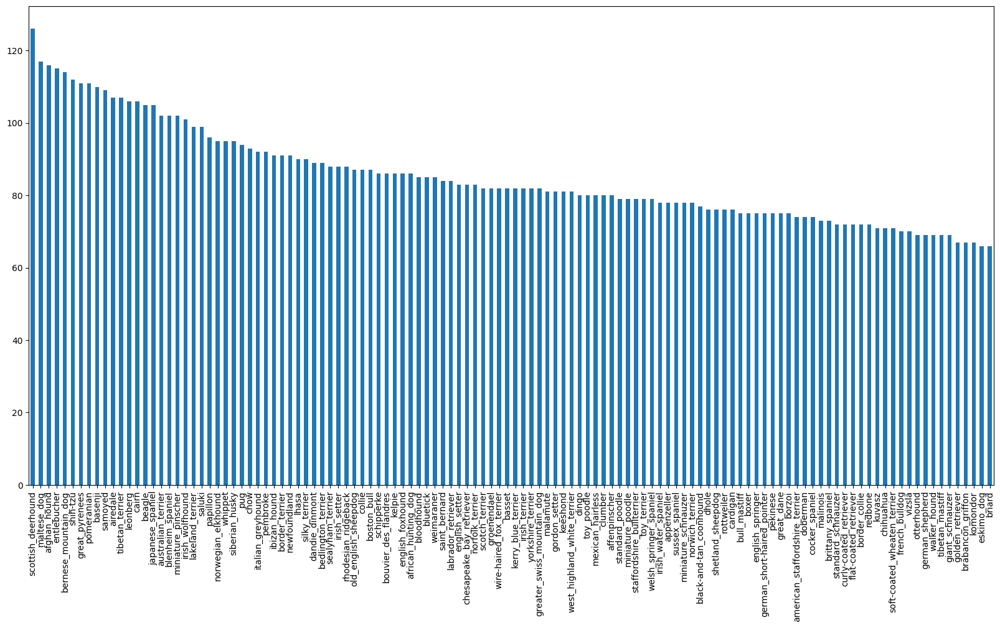

In [ ]:
# How many images are there per breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

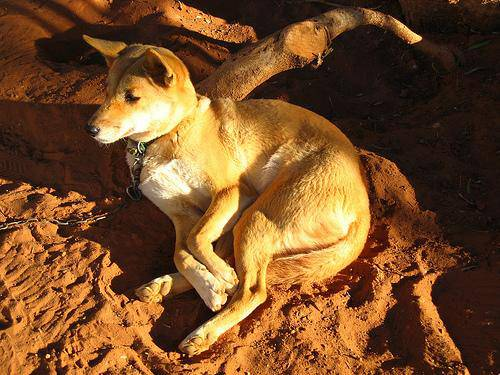

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


### Getting images and their labels

Let's get a list of all of our image file pathnames

In [ ]:
# Create pathnames from image ID's
filenames=["drive/MyDrive/Dog Vision/train/" + fname for fname in labels_csv["id"] + ".jpg"]

filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
len(filenames)

10222

In [ ]:
# Check whether no of filenames matches number of actual image files

import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match the amount , proceed")
else:
  print("OOPS")

Filenames match the amount , proceed


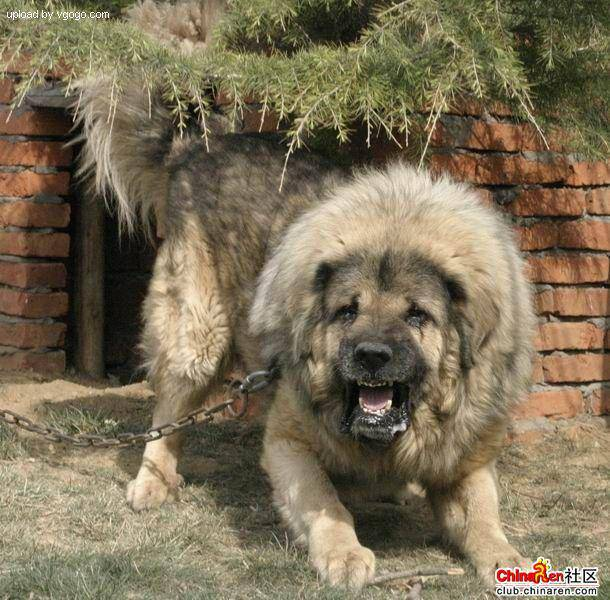

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list,let's prepare our labels.

In [ ]:
import numpy as np
labels=labels_csv["breed"].to_numpy() ## creates a numpy array
#labels=np.array(labels)
labels[0]

'boston_bull'

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches number of filenames
if len(labels)==len(filenames):
  print("Yes matched")
else:
  print("OOPS")

Yes matched


In [ ]:
# Find unique labels values

unique_breeds=np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
(labels[0]==unique_breeds)

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
boolean_labels=[label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example : Turning boolean array into numbers
print(labels[0]) #original label
print(np.where(unique_breeds==labels[0])) #index where label appears
print(boolean_labels[0].argmax()) #index where label appears in boolean array
print(boolean_labels[0].astype(int)) # convert into 1s and 0s

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


# Creating our own Validation Set

In [ ]:
# Setup X and Y variables

x=filenames
y=boolean_labels

We're going to start off experimenting with 1000 images and increase as needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES=1000  #@param {type:"slider",min:1000,max:10000,step:1000}

In [ ]:
from numpy.random.mtrand import rand
# Let's split our data into train and validation

from sklearn.model_selection import train_test_split

# Split them into train and validation of reqd size
x_train,x_val,y_train,y_val=train_test_split(x[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)

len(x_train),len(x_val),len(y_train),len(y_val)

(800, 200, 800, 200)

In [ ]:
 # Let's have a geez at the training data

 x_train[:2],y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

## Preprocessing Images(Turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image file path as input
2. Use TensorFlow to read the file and save it to a variable , 'image'
3. Turn our 'image'(a jpg) into a Tensor
4. Normalize our image(convert 0-255 channels to 0-1 values)
5. Resize the 'image' to be a shape of size (224,224)
6. Return the modified image

Before we do let's see what importing an image looks like

In [ ]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
# turn image into a tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

Now we've seen what an image looks like in Tensor , let's make a function to preprocess them
1. Take an image file path as input
2. Use TensorFlow to read the file and save it to a variable , 'image'
3. Turn our 'image'(a jpg) into a Tensor
4. Normalize our image(convert 0-255 channels to 0-1 values)
5. Resize the 'image' to be a shape of size (224,224)
6. Return the modified image


In [ ]:
# Define image size
IMG_SIZE=224

# create a function for pre-processing images

def process_image(image_path,img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor
  """
  # read an image file
  image=tf.io.read_file(image_path)

  # turn the jpg image into numerical Tensor with 3 colour channels (Red,Green,Blue)
  image =tf.image.decode_jpeg(image, channels=3)

  #Convert the colour channels from 0-255 to 0-1 values
  image=tf.image.convert_image_dtype(image,tf.float32)

  # resize the image to our desired value (224,224)
  image = tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])


  return image


## Turning our data into batches

Let's say you're trying to process all 10k+ images in one go .... they all might not fit into the memory.

So that's why we do about 32(this is the batch size) at a time (we can manually adjust the batch size as we need)

In order to use TensorFlow effectively , we need our data in the form of Tensor tuples which look like this:
'(image , label)'.

In [ ]:
# Create a simple function to return a tuple (image,label)
def get_image_label(image_path,label):
  '''
  Takes an image file path name and the associated label , processes the image and returns a tuple of (image,label)
  '''
  image=process_image(image_path)
  return image,label

In [ ]:
get_image_label(x[42],tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form : (image , label) , let's make a function to turn all of our data ('X' and 'Y') into batches.

In [ ]:
# Define batch size , 32 is the default

BATCH_SIZE=32

# Create a function to turn data into batches
def create_data_batches(x,y=None,batch_size=BATCH_SIZE,valid_data=False , test_data=False):
  '''
  Creates batches of data out of image(x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  '''

  # If the data is a test dataset, we probably don't have any labels
  if test_data:
    print("Creating test data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths (no labels)
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid set , we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y))) # filepaths and labels
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # We're left with training set which we will shuffle
  else:
    print("Creating training data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    #shuffling pathnames and labels
    data=data.shuffle(buffer_size=len(x))
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

In [ ]:
# Creating training and validation data batches
train_data=create_data_batches(x_train,y_train)
val_data=create_data_batches(x_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Checkout diff attributes of data batches
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches , however , these can be a little hard to understand/comprehend, let's visualize them.

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images,labels):
  '''
  displays a plot of 25 images and their labels from a data batch
  '''
  # setup the figure
  plt.figure(figsize=(20,15))
  # Loop through 25
  for i in range(25):
    #Create subplots
    ax=plt.subplot(5,5,i+1)
    #Display an image
    plt.imshow(images[i])
    #add label
    plt.title(unique_breeds[labels[i]])
    #Turn the gridlines off
    plt.axis('off')

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images,train_labels=next(train_data.as_numpy_iterator())
train_images,train_labels

(array([[[[0.59180677, 0.58396363, 0.6271009 ],
          [0.54908746, 0.5412443 , 0.5843816 ],
          [0.5546547 , 0.5468116 , 0.58994883],
          ...,
          [0.9843138 , 1.        , 0.9803922 ],
          [0.9843138 , 1.        , 0.9803922 ],
          [0.9843138 , 1.        , 0.9803922 ]],
 
         [[0.5951156 , 0.58727247, 0.6304097 ],
          [0.5520549 , 0.54421175, 0.587349  ],
          [0.5542017 , 0.5463586 , 0.58949584],
          ...,
          [0.99093145, 1.        , 0.9803922 ],
          [0.99093145, 1.        , 0.9803922 ],
          [0.99093145, 1.        , 0.9803922 ]],
 
         [[0.5941352 , 0.5862921 , 0.62942934],
          [0.5506478 , 0.54280466, 0.5859419 ],
          [0.55223435, 0.5443912 , 0.58752847],
          ...,
          [0.99375004, 1.        , 0.9803922 ],
          [0.99375004, 1.        , 0.9803922 ],
          [0.99375004, 1.        , 0.9803922 ]],
 
         ...,
 
         [[0.39061627, 0.40630257, 0.4533614 ],
          [0.35343

In [ ]:
len(train_images),len(train_labels)

(32, 32)

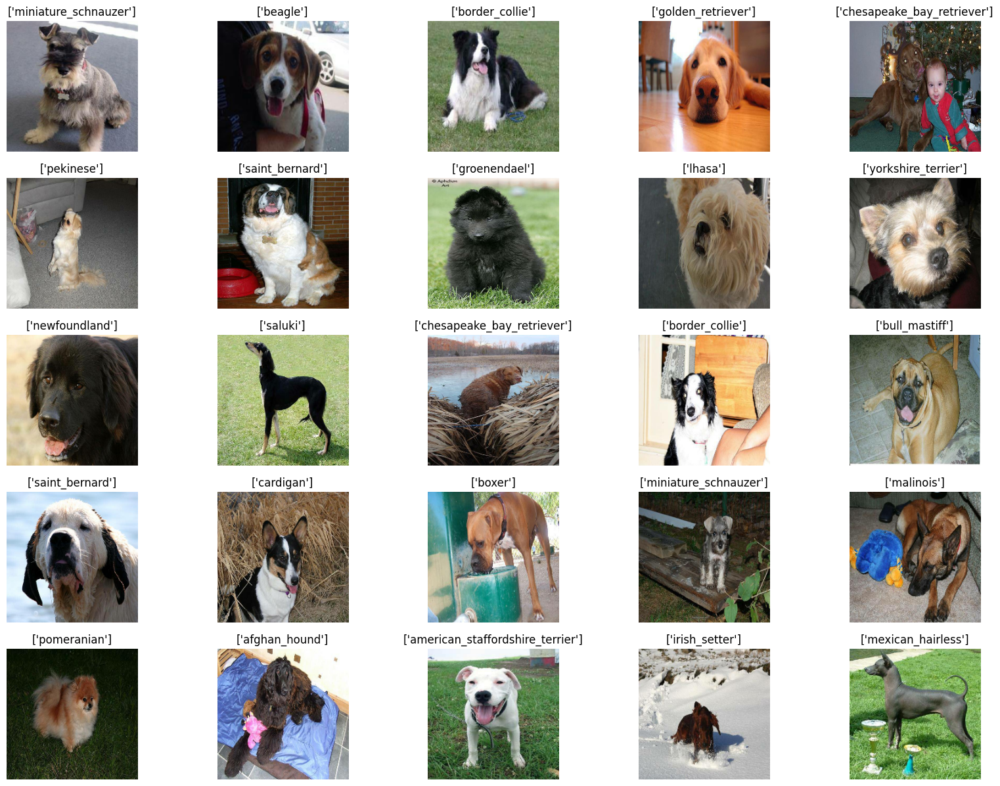

In [ ]:
# Now let's visualize the data in training batch
show_25_images(train_images,train_labels)

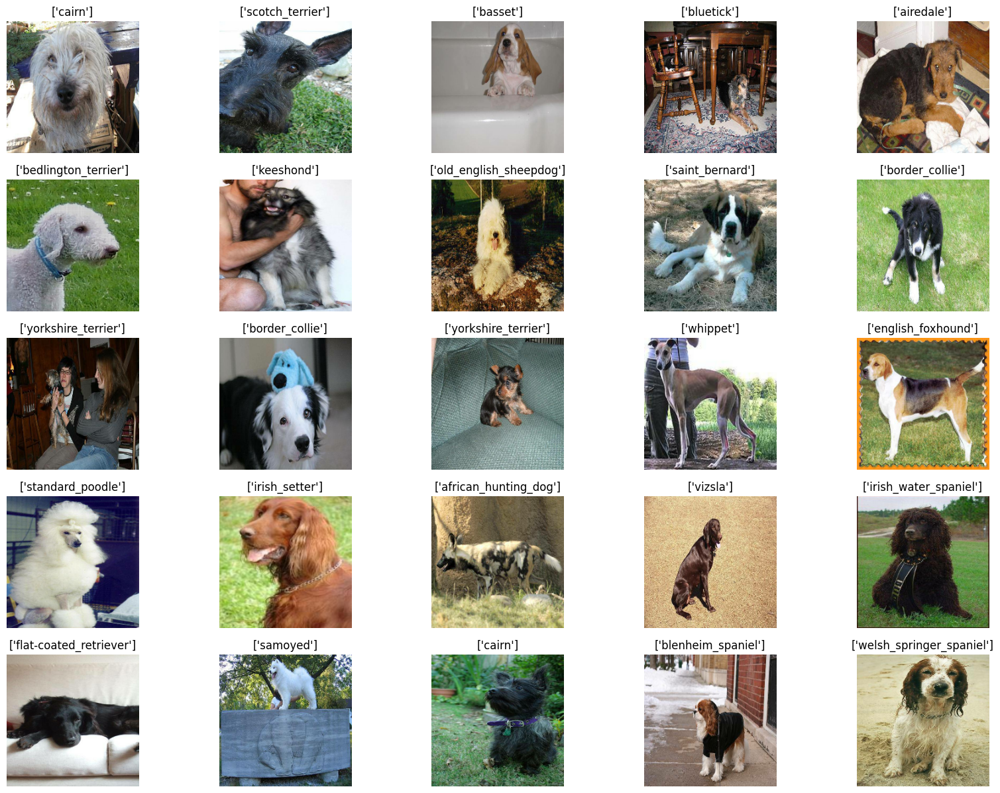

In [ ]:
 # Now let's visualize the data in training batch
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a Model

Before we build a model ,there are a few things we need to define:

* The input shape(our images shape , in the form of a Tensor) to our model.
* The output shape(image labels, in the form of Tensors) of our model.
* The URL of the model we want to use



In [ ]:
# Setup input shape to the model
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3] # batch , height , width , colour channels

# Setup output shape of our model
OUTPUT_SHAPE=len(unique_breeds)

# Setup model url from tensorflow hub
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our inputs , outputs and model ready to go.
Let's put it together into a Keras deep learning model!

Knowing this let's create a function which:
* Takes the input shape ,ouput shape and model we've chosen as parameters
* Define the layers in a Keras model in sequential fashion.
* Compiles the model (says it should be evaluated and improved).
* Builds the model (Tells the model the input shape it'll be getting)
* Returns the model.

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  #setup the model layers
  model=tf.keras.Sequential([hub.KerasLayer(MODEL_URL),tf.keras.layers.Dense(units=OUTPUT_SHAPE,activation="softmax")])

  # Compile the model
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model=create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating Callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress , check its progress or stop training early if a model stops improving.

We'll create two callbacks , one for TensorBoard which helps track our models progress and another for early stopping which prevents our model for training for too long.

### TensorBoard Callback

To setup a TensorBoard callback , we need to do 3 things:
1. Load the TensorBoard callback extension
2. Create TensorBoard callback which is able to save logs to a directory and pass it to our model's 'fit()' function.
3. Visualise our model's traning logs with  %tensorboard magic function.


In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

#Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # create log directory for storing tensorboard logs
  logdir=os.path.join("drive/MyDrive/Dog Vision/logs",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)


### Early Stopping Callback

Helps stops model from overfitting by stopping training if certain evaluation metric stops improving.

In [ ]:
#Create early stopping callback
early_stopping =tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

## Training our model (on subset of data)

Our first model is only going to train on 1000 images , to make sure everything is working.


In [ ]:
NUM_EPOCHS=100 #@param {type:'slider',min:10,max:100,step:10}

In [ ]:
# Check to make sure of GPU availability
print("GPU","available(YESSS!!!)" if tf.config.list_physical_devices("GPU") else "not available!!")

GPU available(YESSS!!!)


Let's create a function which trains a model

* Create a model using create_model()
* Setup a TensorBoard callback using create_tensorboard_callback()
* Call the fit() function on our model passing it the training data , validation data , number of epochs to train for (NUM_EPOCHS) and the callback we'd like to use
* Return the model


In [ ]:
# Build a function to train and return the trained model
def train_model():
  """
  Trains a given model and returns the trained version
  """
  # Create a model
  model=create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard=create_tensorboard_callback()

  # Fit the model to the data , passing it the callbacks we've created
  model.fit(x=train_data,epochs=NUM_EPOCHS,validation_data=val_data,validation_freq=1,callbacks=[tensorboard,early_stopping])

  #Return the fitted model
  return model

In [ ]:
model=train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 189s 6s/step - loss: 4.5984 - accuracy: 0.0925 - val_loss: 3.3788 - val_accuracy: 0.2800
Epoch 2/100
25/25 [==============================] - 3s 119ms/step - loss: 1.6556 - accuracy: 0.6837 - val_loss: 2.1290 - val_accuracy: 0.4950
Epoch 3/100
25/25 [==============================] - 4s 147ms/step - loss: 0.5776 - accuracy: 0.9312 - val_loss: 1.6659 - val_accuracy: 0.5700
Epoch 4/100
25/25 [==============================] - 4s 175ms/step - loss: 0.2572 - accuracy: 0.9862 - val_loss: 1.4818 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 3s 118ms/step - loss: 0.1468 - accuracy: 0.9950 - val_loss: 1.4004 - val_accuracy: 0.6150
Epoch 6/100
25/25 [==============================] - 3s 116ms/step - loss: 0.1013 - accuracy: 1.0000 - val_loss: 1.3595 - val_accuracy: 0.6400
Epoch 7/100
25/25 [==============================]

### Checking TensorBoard Logs

The TensorBoard magic function (%tensorboard) will access the logs directory and visualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data. (not used to train on)
predictions = model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 3s 96ms/step


array([[2.2668978e-03, 3.5040539e-05, 3.1976488e-03, ..., 1.8867607e-04,
        2.4728943e-04, 6.6408538e-03],
       [2.1938821e-03, 1.5722084e-03, 8.9437427e-04, ..., 6.6106051e-04,
        1.5323992e-03, 1.5205979e-04],
       [2.2570359e-05, 4.9402675e-05, 1.9658908e-04, ..., 1.0950903e-04,
        2.9530647e-05, 7.0756453e-04],
       ...,
       [8.0728178e-06, 6.1990278e-05, 1.9777057e-05, ..., 2.4231551e-06,
        8.2112034e-05, 2.0508049e-05],
       [4.2505767e-03, 5.4768687e-05, 1.2651451e-04, ..., 1.2927619e-04,
        2.7496519e-05, 1.4504988e-02],
       [1.2377385e-04, 7.3680121e-06, 6.3429744e-04, ..., 4.8865727e-03,
        1.4116752e-03, 2.9846115e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# First prediction
index =42
print(predictions[index])
print(f"Max value (probability of prediction):{np.max(predictions[index])}")
print(f"Sum:{np.sum(predictions[index])}")
print(f"Max Index: {np.argmax(predictions[index])}")
print(f"Predicted label:{unique_breeds[np.argmax(predictions[index])]}")


[1.48209845e-04 8.83835746e-05 1.90327974e-05 9.39313668e-06
 1.61897170e-03 1.77891925e-05 5.96229693e-05 6.27307163e-04
 2.28724023e-03 1.73195153e-02 1.86564503e-05 7.00570899e-06
 7.66110170e-05 4.18621628e-03 1.67020410e-03 2.02271994e-03
 4.95784798e-06 6.49519352e-05 1.04686893e-04 1.99673173e-04
 1.15121911e-05 3.36752564e-04 2.84200287e-05 1.92151238e-05
 7.28610950e-03 1.31038076e-04 4.68022190e-05 2.02760333e-04
 1.27466934e-04 4.62614989e-05 8.62352899e-05 6.32795127e-05
 1.26840550e-05 5.81180757e-05 4.30092441e-05 5.04469244e-05
 3.54667463e-05 1.15038449e-04 3.62438113e-05 9.19863656e-02
 9.16724093e-05 1.03424172e-05 2.50109751e-03 2.29571606e-06
 3.47547575e-05 1.58396688e-05 5.28153687e-05 1.53200628e-04
 2.02617193e-05 8.81168671e-05 2.48890628e-05 1.26464249e-04
 2.00869370e-04 1.95039000e-04 3.27039015e-06 1.27021354e-04
 3.38031241e-05 6.84612496e-06 5.40414549e-05 3.66382155e-05
 4.40003023e-05 2.38819383e-04 9.80328650e-07 1.88622944e-05
 2.86034301e-05 7.291336

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the images as well on which the prediction is being made.

** NOTE :** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn probabilities into their respective labels
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities

pred_label=get_pred_label(predictions[2])
pred_label

'basset'

Now since our validation data is still in form of a batch dataset(easier for TensorFlow to make calculations) , we'll have to unbatchify it to make predictions on the validation images and compare the predictions to the validation labels(truth labels).

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensors and returns seperate arrays of images and labels
  """

  images=[]
  labels=[]

  # Loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

# Unbatchify the validation data
val_images,val_labels=unbatchify(val_data)
val_images[0],val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got our ways to get:
* Prediction Labels
* Validation Labels(truth labels)
* Validation Images

Let's make a function to visualize it more.

We'll create a function which:
* Takes an array of prediction prob , array of truth labels and array of images and an integer.
* Convert the pred prob into pred label
* Plot the pred label , its pred prob , the truth label and target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities,labels,images, n=1):
  """
  View the prediction , ground truth and image for a sample n
  """
  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]

  # Get the pred label
  pred_label=get_pred_label(pred_prob)

  #PLot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change colour if prediction is correct
  if pred_label==true_label:
    color="green"
  else:
    color="red"

  # Change plot title predicted , prob of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,np.max(pred_prob)*100,true_label),color=color)



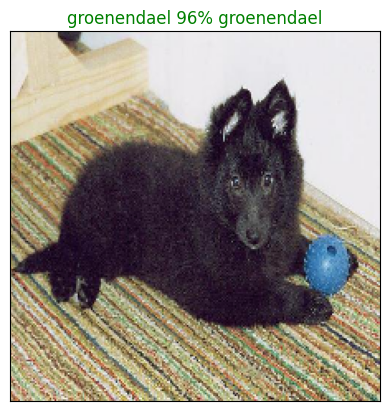

In [ ]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=77)

 Now we've got one function to visualize our model's top predictions , let's make another to view our models top 10 predictions.

 This function will:
 * Take an input of prediction probabilities array and a ground truth array and an integer.
 * Find the predicted label using 'get_pred_label()'
 * Find the top 10:
    * Prediction probability indexes
    * Prediction probability values
    * Prediction labels
 * Plot the top 10 pred prob values and labels .

In [ ]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
   Plot the top 10 highest prediction confidences along with the truth label for sample n
  """
  pred_prob,true_label=prediction_probabilities[n],labels[n]

  #Get the predicted label
  pred_label=get_pred_label(pred_prob)

  # FINd the top 10 pred confidence indexes
  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]

  # Find the top 10 pred confidence values
  top_10_pred_values=pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels=unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),top_10_pred_values,color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),labels=top_10_pred_labels,rotation='vertical')

  # Change color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass

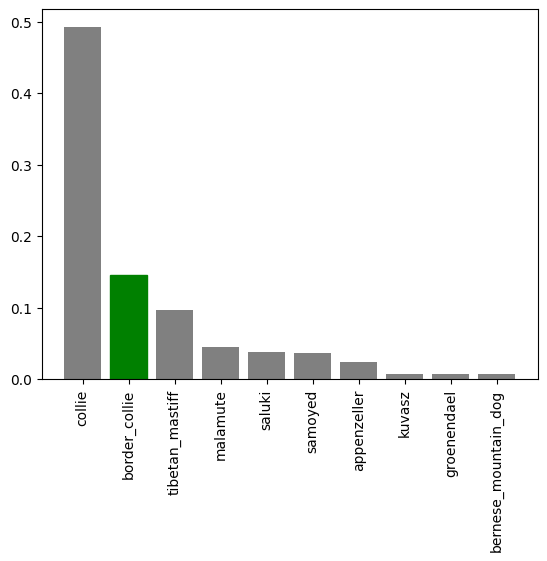

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=9)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few

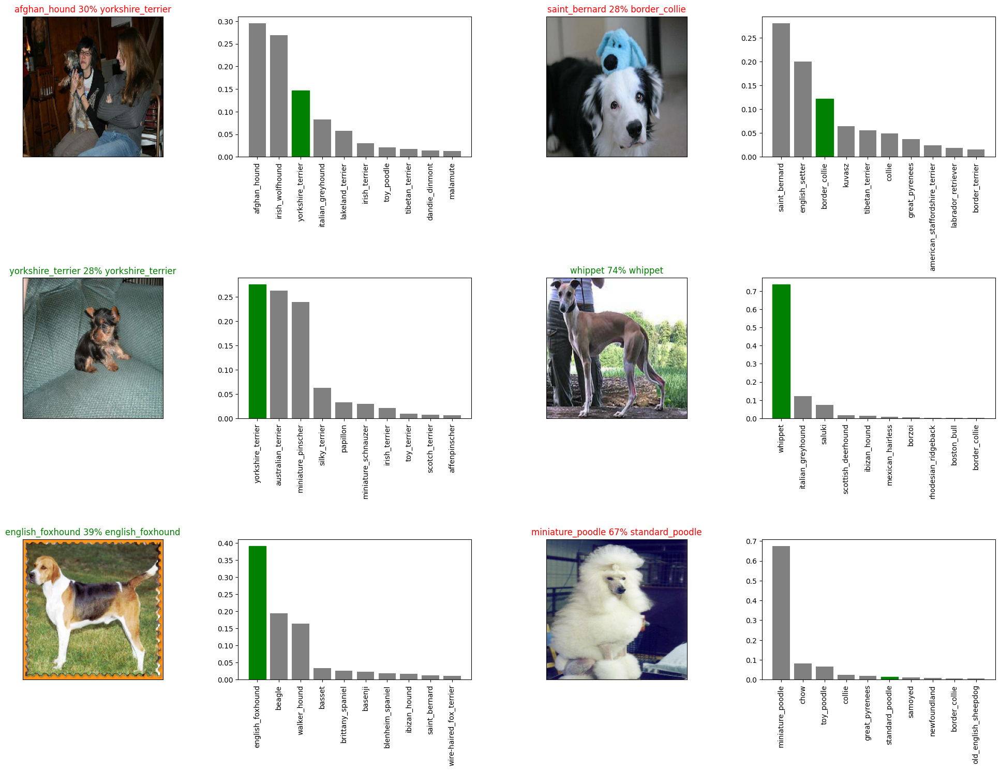

In [ ]:
# Let's check a few predictions and their diff values

i_multiplier=10
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()


**Challenge:** How can we create a confusion matrix with our models predictions and true labels?

## Saving and loading a trained model

In [ ]:
# Create a function to save a model
def save_model(model,suffix=None):
  """
  Saves a given model in a directory and appends a suffix(string).
  """
  #Create a model directory pathname with current time
  modeldir=os.path.join("drive/MyDrive/Dog Vision/models",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  model_path=modeldir+"-"+suffix + ".h5" #save format of model

  print(f"Saving Model to:{model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a model
def load_model(model_path):
  """
  Loads a saved model from specified path
  """
  print(f"Loading saved model from:{model_path}")
  model=tf.keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})

  return model

Now we've got functions to save and load a trained model

In [ ]:
# Save our model trained on 1000 images
save_model(model,suffix="1000-images-mobilenetv2-Adam")

Saving Model to:drive/MyDrive/Dog Vision/models/20230717-171404-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20230717-171404-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model=load_model( "drive/MyDrive/Dog Vision/models/20230714-140525-1000-images-mobilenetv2-Adam.h5")

Loading saved model from:drive/MyDrive/Dog Vision/models/20230714-140525-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 148ms/step - loss: 1.2579 - accuracy: 0.6600


[1.2578785419464111, 0.6600000262260437]

In [ ]:
# Evaluate loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 98ms/step - loss: 1.2270 - accuracy: 0.6950


[1.2269909381866455, 0.6949999928474426]

## Training a Big Dog Model (On the Full data)

In [ ]:
# Create data batch with full data set

full_data=create_data_batches(x,y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model=create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard=create_tensorboard_callback()
# No validation set when training on all the data , so we can't monitor val accuracy
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,epochs=NUM_EPOCHS,callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 40s 112ms/step - loss: 1.3493 - accuracy: 0.6626
Epoch 2/100
320/320 [==============================] - 34s 107ms/step - loss: 0.4059 - accuracy: 0.8802
Epoch 3/100
320/320 [==============================] - 36s 112ms/step - loss: 0.2382 - accuracy: 0.9350
Epoch 4/100
320/320 [==============================] - 34s 107ms/step - loss: 0.1557 - accuracy: 0.9611
Epoch 5/100
320/320 [==============================] - 35s 110ms/step - loss: 0.1067 - accuracy: 0.9792
Epoch 6/100
320/320 [==============================] - 34s 107ms/step - loss: 0.0780 - accuracy: 0.9869
Epoch 7/100
320/320 [==============================] - 34s 107ms/step - loss: 0.0606 - accuracy: 0.9899
Epoch 8/100
320/320 [==============================] - 34s 107ms/step - loss: 0.0458 - accuracy: 0.9946
Epoch 9/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0374 - accuracy: 0.9963
Epoch 10/100
320/320 [==============================] - 35s 108m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving Model to:drive/MyDrive/Dog Vision/models/20230717-190906-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20230717-190906-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model=load_model("drive/MyDrive/Dog Vision/models/20230717-190906-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from:drive/MyDrive/Dog Vision/models/20230717-190906-full-image-set-mobilenetv2-Adam.h5


# Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data , we'll have to get it in the same format.

To make predictions we'll:
* Get the test image filenames
* Convert the filenames into test data using 'create_data_batches()' and setting test_data parameter to True .
* Make predictions array by passing the test batches to the predict() method called on our model.

In [ ]:
# Load test image file names
test_path="drive/MyDrive/Dog Vision/test/"
test_filenames=[test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e73d52671c56e1507fed58c4c287d5f1.jpg',
 'drive/MyDrive/Dog Vision/test/e806a67a05289ac6de6831001664b81b.jpg',
 'drive/MyDrive/Dog Vision/test/e7fcdf9671a6593b638cbee42842f981.jpg',
 'drive/MyDrive/Dog Vision/test/e5fc0207e1db00fa778b00832f622b10.jpg',
 'drive/MyDrive/Dog Vision/test/e46a2bfb7816324d171c4e07786abc59.jpg',
 'drive/MyDrive/Dog Vision/test/deac194013c246095f0e88cd8b6b90d2.jpg',
 'drive/MyDrive/Dog Vision/test/e0295b9b1bee725d52d74f9af84092cf.jpg',
 'drive/MyDrive/Dog Vision/test/e25f28a6c07bf3909c4310b2685f6caf.jpg',
 'drive/MyDrive/Dog Vision/test/e062ea256ada165dfe998fbc6529dff7.jpg',
 'drive/MyDrive/Dog Vision/test/e4413cd1ee44a05cc7991ae0d097b062.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Convert into test data batches
test_data=create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions using full loaded model
test_predictions=loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 1277s 4s/step


In [ ]:
# Save predictions(Numpy array)to csv file(for access later)
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv",test_predictions,delimiter=",")

In [ ]:
# Load predictions from CSV file
test_predictions=np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv",delimiter=",")

# Preparing test dataset predictions for Kaggle

we need data in a dataframe with ID and a column for each different dog breed.

To get data in this format we'll:
* Create pandas dataframe with an ID column and column for each dog breed.
* Add data to the ID column by extracting test image ID's from their filepaths.
* Add data to each dog breed column
* Export dataframe as CSV

In [ ]:
# Create a pandas DataFrame
preds_df=pd.DataFrame(columns=['id'] + list(unique_breeds))

In [ ]:
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids[:5]

['e73d52671c56e1507fed58c4c287d5f1',
 'e806a67a05289ac6de6831001664b81b',
 'e7fcdf9671a6593b638cbee42842f981',
 'e5fc0207e1db00fa778b00832f622b10',
 'e46a2bfb7816324d171c4e07786abc59']

In [ ]:
preds_df["id"]=test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e73d52671c56e1507fed58c4c287d5f1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e806a67a05289ac6de6831001664b81b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e7fcdf9671a6593b638cbee42842f981,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e5fc0207e1db00fa778b00832f622b10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e46a2bfb7816324d171c4e07786abc59,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
preds_df[list(unique_breeds)]=test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e73d52671c56e1507fed58c4c287d5f1,1.939696e-09,4.952663e-11,3.079923e-10,3.532114e-09,1.324578e-10,1.679651e-05,8.340888e-11,4.532555e-10,1.016673e-09,...,1.680224e-09,7.152684e-13,7.321158e-10,1.359551e-09,7.413631e-11,3.011370e-08,4.901723e-09,1.776610e-10,4.869086e-11,4.520932e-11
1,e806a67a05289ac6de6831001664b81b,3.978379e-15,4.419826e-07,5.078671e-11,5.363132e-11,6.431871e-14,4.221291e-12,2.050048e-11,1.889716e-12,7.438943e-08,...,3.254723e-11,8.521293e-12,1.856182e-09,1.215388e-10,7.026291e-12,2.489933e-12,1.013615e-14,1.110068e-08,5.618875e-11,1.158151e-10
2,e7fcdf9671a6593b638cbee42842f981,3.381823e-14,3.501183e-12,4.803554e-13,1.133727e-12,2.060824e-12,3.066440e-12,3.788015e-12,6.388874e-13,5.658467e-10,...,4.691058e-15,1.072214e-13,3.423004e-15,8.658495e-11,2.844739e-15,1.000000e+00,1.864416e-11,1.600088e-11,2.395240e-12,1.249544e-14
3,e5fc0207e1db00fa778b00832f622b10,6.287276e-10,3.300599e-09,3.801228e-05,1.977128e-02,4.764624e-10,5.889180e-11,3.856674e-08,3.686500e-06,2.235563e-06,...,8.742286e-09,2.627014e-09,5.190265e-05,1.851027e-09,1.498407e-03,4.158102e-06,3.752214e-10,1.502453e-03,6.030636e-10,1.057252e-07
4,e46a2bfb7816324d171c4e07786abc59,9.370279e-14,5.699230e-11,2.443612e-12,1.649895e-09,7.871874e-12,1.998247e-10,6.477241e-12,8.441251e-11,3.927516e-11,...,6.065828e-07,1.138858e-09,3.623994e-10,1.560584e-11,1.400898e-08,1.281665e-12,1.671956e-10,1.372290e-09,9.741441e-08,6.041705e-11


In [ ]:
# Save our predictions dataframe to CSV
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetv2.csv",index=False)

# Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of the images
* Turn the file paths into data batches using 'create_data_batches()'
and set test_data to True.
* Pass the custom image data to 'predict()' method of the model.
* Convert prediction output probabilites to prediction labels.
* Compare predicted labels to custom images.


In [ ]:
# Get custom image file paths
custom_path="drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths=[custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog Vision/my-dog-photos/photo-1632165258904-21ca36a01ee0.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/istockphoto-1137588586-612x612.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/photo-1589210043112-d4835d91b37a.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/IMG_20230718_013018_623.jpg']

In [ ]:
# Turn custom images into batch data set
custom_data=create_data_batches(custom_image_paths,test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# MAke predictions
custom_preds=loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [ ]:
len(custom_preds)

4

In [ ]:
# Get custom image prediction labels
custom_pred_labels=[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['pug', 'rottweiler', 'lhasa', 'walker_hound']

In [ ]:
# Get custom images (can't unbatchify since we dont have labels)
custom_images=[]
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

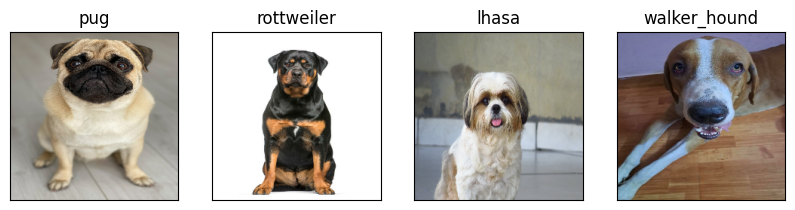

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i , image in enumerate(custom_images):
  plt.subplot(1,4,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

In [ ]:
list(unique_breeds)

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenendael',
